# CMSC641 Final Project - Jingning Mao

The 2008 financial crisis began in December 2007 and ended in June 2009. This project downloads Employment and retails data from the following web sites, wrangling and analyzing data, try to find useful features that can predict market trend.

## Part 2:	Analyze retails data and check whether the retails data can predict the Macro Market. 

### Data Sources:
    - https://www.census.gov/retail/mrts/www/mrtssales92-present.xls
    - https://www.census.gov/retail/index.html
    - http://www.inflation.eu/inflation-rates/united-states/historic-inflation/cpi-inflation-united-states.aspx
 
    a.  Download data files and Import Data Files into SQL Server DB:
        - 1 purchases 1992-2015.xls
        - 2 sales 1992-2015.xls 
        - 3 US Retail Trade Sales - Total and E-commerce 1998-2015.xls
        - 4 Gross Margin 1993-2015.xls
        - 5 inventories 1992-2015.xls
        - 6 Gross Margin as Percentage of Sales 1993-2015.xls
        - 7 Inflations 1986-2016.xlsx
        - 0 mrtssales92-present.xls (monthly sales from 1992 to 2017)
        
    b.  Consolidate Data:
        - Remove duplocate data and null value rows
        - Some kinds of business are named differenctly even they have the same code. Change the data and make sure one to one relationship between code and name.
        - Pivot data tables
        - combine monthly retails data into one table
        
    c.  Analyze retails data cross years

In [108]:
%matplotlib inline
import seaborn as sns
import pyodbc
import pandas as pd
import numpy as np
import scipy
import matplotlib as mpl
import matplotlib.pyplot as plt
from helpers import *

retailsConnStr = 'DRIVER={SQL Server};SERVER=MAO2015;DATABASE=Retails;UID=rpt_user;PWD=itrpt1!'

In [109]:
retails_cnxn = pyodbc.connect(retailsConnStr)

e_commerce_sql =  "select Rpt_Year, [Kind of Business] as Kind_of_Business, u.Amt_Type, u.Amount from New_E_Commerce s unpivot (Amount for Amt_Type in ([E-commerce], Total, [E-Commerce/Total])) u;"

ecData = pd.read_sql(e_commerce_sql, retails_cnxn)

retails_cnxn.close()

ecData.head()

,Rpt_Year,Kind_of_Business,Amt_Type,Amount
0,1998,Total Retail Trade,E-commerce,4.984000e+03
1,1998,Total Retail Trade,Total,2.581762e+06
2,1998,Total Retail Trade,E-Commerce/Total,1.930465e-01
3,1998,Motor vehicle and parts dealers,E-commerce,3.820000e+02
4,1998,Motor vehicle and parts dealers,Total,6.884150e+05


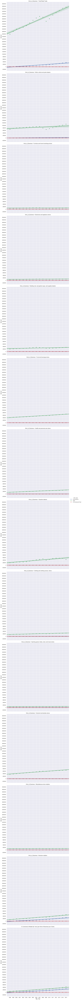

In [110]:
ShowLmplotByRow(data=ecData,x='Rpt_Year', y='Amount', hue='Amt_Type', 
                row='Kind_of_Business', bins=30, size=10,
                title='E-Commerce Retails By Year (per Kind of Business per Chart)')

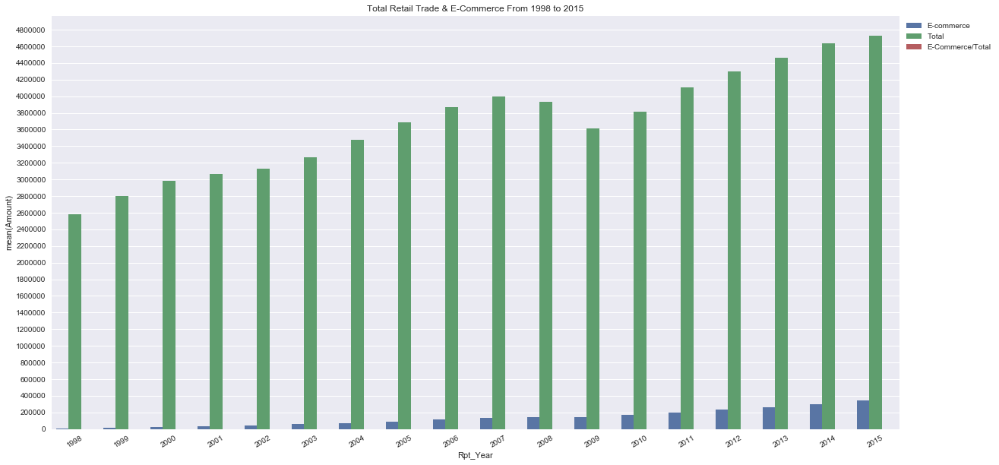

In [111]:
df = ecData.loc[(ecData['Kind_of_Business'] == "Total Retail Trade")]
ShowBarPlot(data=df, x='Rpt_Year',y='Amount',hue='Amt_Type',bins=30, 
           title='Total Retail Trade & E-Commerce From 1998 to 2015',
           rotation=30,figsize_x=20, figsize_y=10)

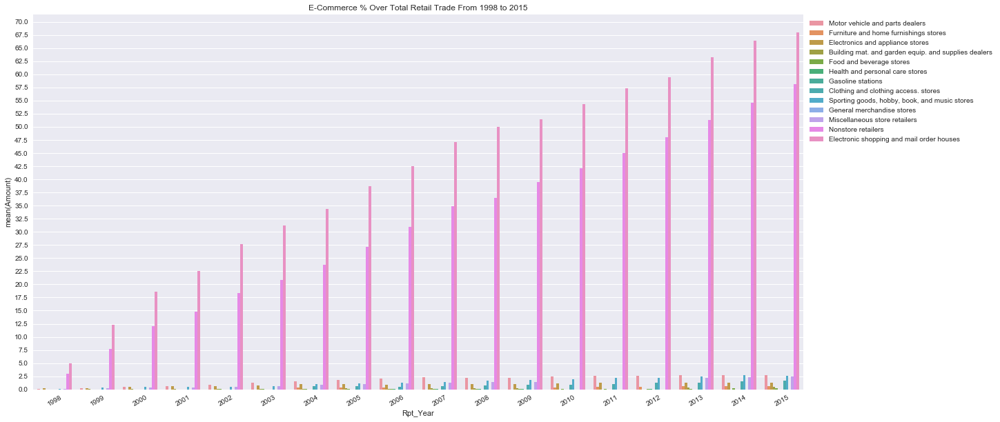

In [112]:
df = ecData.loc[(ecData['Amt_Type'] == "E-Commerce/Total") & (ecData['Kind_of_Business'] != "Total Retail Trade")]
ShowBarPlot(data=df, x='Rpt_Year',y='Amount',hue='Kind_of_Business',bins=30, 
           title='E-Commerce % Over Total Retail Trade From 1998 to 2015',
           rotation=30,figsize_x=20, figsize_y=10)

#### 2.1.2 E-Commerce Data Analysis Conclusion
	- Most increased businesses:
		1) Electronic shopping and mail order houses
		2) Nonstore retailers
	- During 2008 crisis period, the E-Commerce sales rised slowly (2008-2009)
	- Over all, the E-Commerce sales are sky rocked 
	- After E-Commerce sales data visualization, the E-Commerce can be extented to the following businesses:
		2) Food and beverage stores
		3) Food services and drinking places
		4) General merchandise stores
		5) Grocery stores
		6) Health and personal care stores
		8) Other general merchandise stores
		9) Pharmacies and drug stores
		10) Supermarkets and other grocery (except convenience) stores
		11) Warehouse clubs and supercenters

#### 2.2.1.  Get Gross Margin % Of Sales Data to Analyze
###### Formula: [Gross Margin %] = ([Revenue] - [Cost of Sales]) / [Revenue]

In [113]:
retails_cnxn = pyodbc.connect(retailsConnStr)

gmPct_sql = "select * from New_Gross_MarginAsPctOfSales"

gmPctData = pd.read_sql(gmPct_sql, retails_cnxn)

retails_cnxn.close()

gmPctData.head()

,NAICS Code,Kind of Business,Amount,Rpt_Year
0,T3,"Retail gross margin as a percentage of sales, ...",27.9,1993
1,T9,Total (excl. motor vehicle and parts dealers),30.3,1993
2,T1,GAFO,33.8,1993
3,441,Motor vehicle and parts dealers,20.5,1993
4,4411,Automobile dealers,18.4,1993


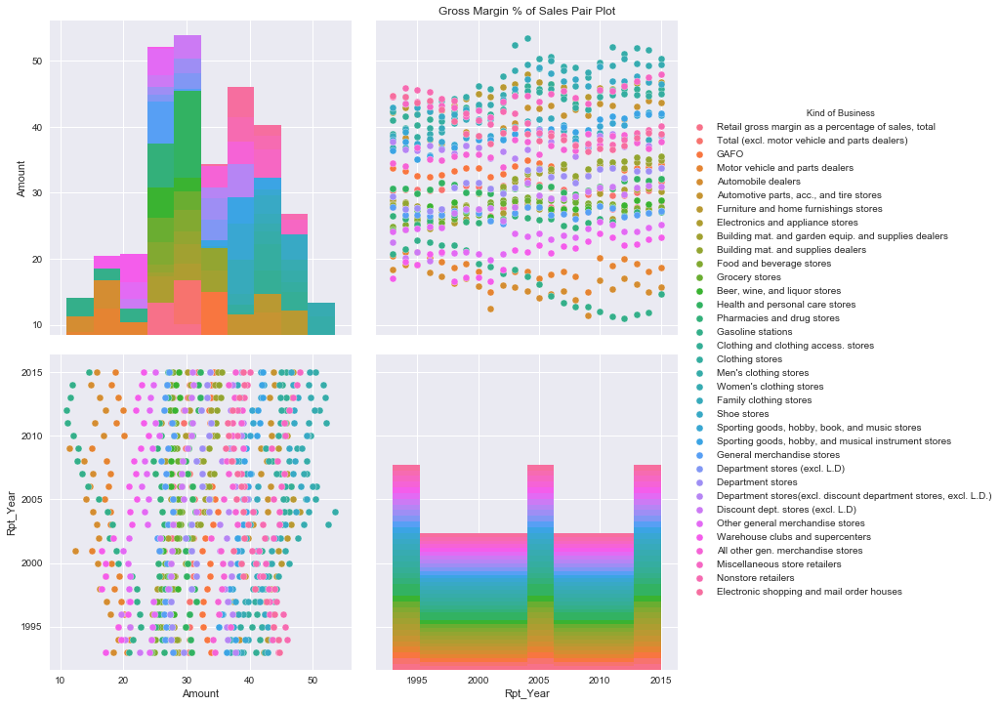

In [114]:
ShowPairplot(data=gmPctData, hue="Kind of Business", title="Gross Margin % of Sales Pair Plot", size=5)

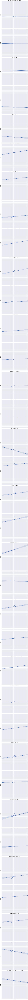

In [115]:
ShowLmplotByRowNoHue(data=gmPctData,x='Rpt_Year', y='Amount',  row='Kind of Business', bins=30, size=10,
                     title='Gross Margin % Of Sales Cross Year (per Kind of Business per Chart) - 1993 ~ 2015')

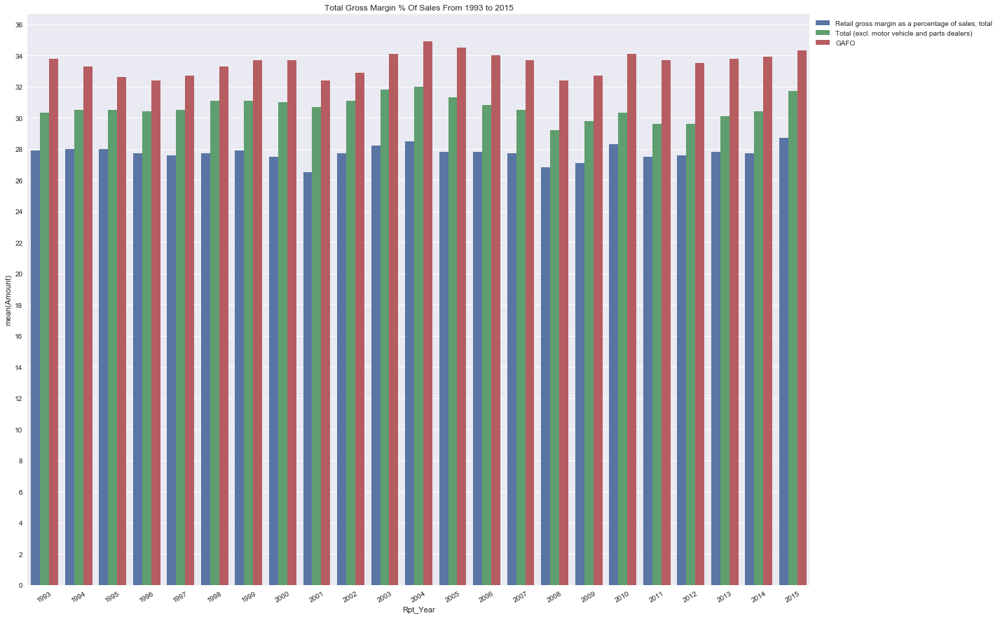

In [116]:
value_list= ['T3','T9','T1']

df = gmPctData[gmPctData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Total Gross Margin % Of Sales From 1993 to 2015',
           rotation=30,figsize_x=20, figsize_y=15)

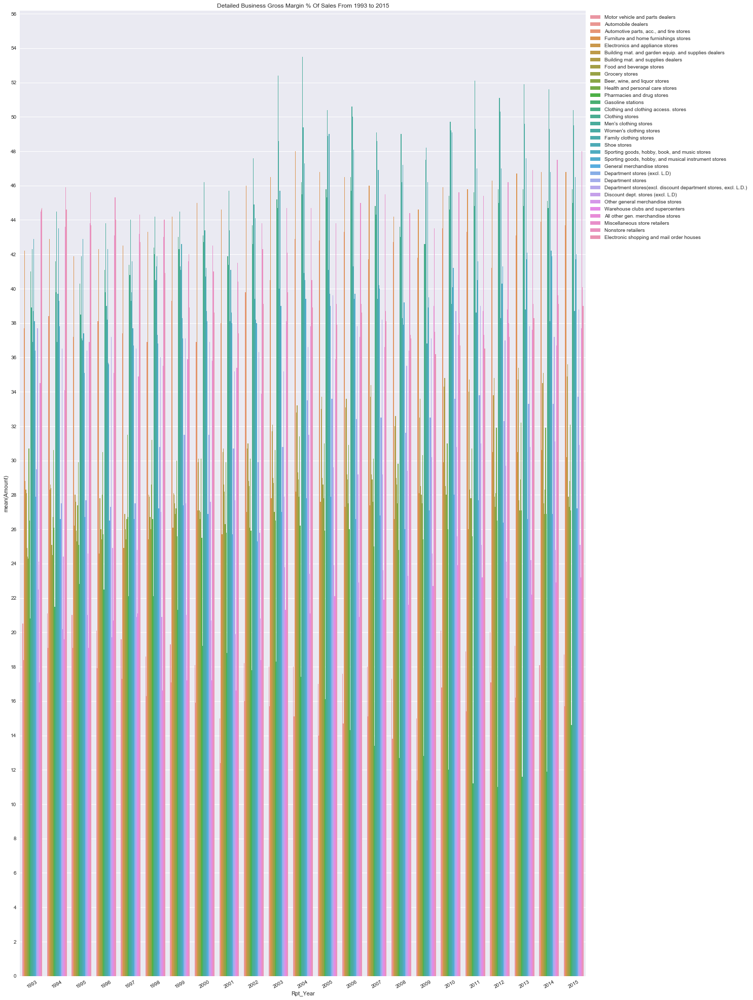

In [117]:
value_list= ['T3','T9','T1']

df = gmPctData[~gmPctData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Detailed Business Gross Margin % Of Sales From 1993 to 2015',
           rotation=30,figsize_x=20, figsize_y=35)

#### 2.2.2. Gross Margin % of Sales Data Analysis Conclusion
	- From the yearly total Gross Margin %, we can see it leads the market trend. The total Gross Margin % started decreased since year 2005 and consistently dropped until 2008. It started increasing in 2009. The 2008 crisis was ended in 2009.
	- Comparing with other retails data, the Gross Margin % can predict the market better.
    - Total (excl. motor vehicle and parts dealers) of Gross Margin % reflect the healthy of the market. If it shrinks, investors can also foresee a possible slow down in the stock market or even a pending recession. 

#### 2.3.1.  Get Gross Margin Data to Analyze
###### Formula: [Gross Margin] = ([Revenue] - [Cost of Sales]) 

In [118]:
retails_cnxn = pyodbc.connect(retailsConnStr)

gm_sql = "select * from New_Gross_Margin"

gmData = pd.read_sql(gm_sql, retails_cnxn)

retails_cnxn.close()

gmData.head()

,NAICS Code,Kind of Business,Amount,Rpt_Year
0,T4,"Retail gross margin, total",540822.0,1993
1,T9,Total (excl. motor vehicle and parts dealers),443740.0,1993
2,T1,GAFO,193078.0,1993
3,441,Motor vehicle and parts dealers,97082.0,1993
4,4411,Automobile dealers,74904.0,1993


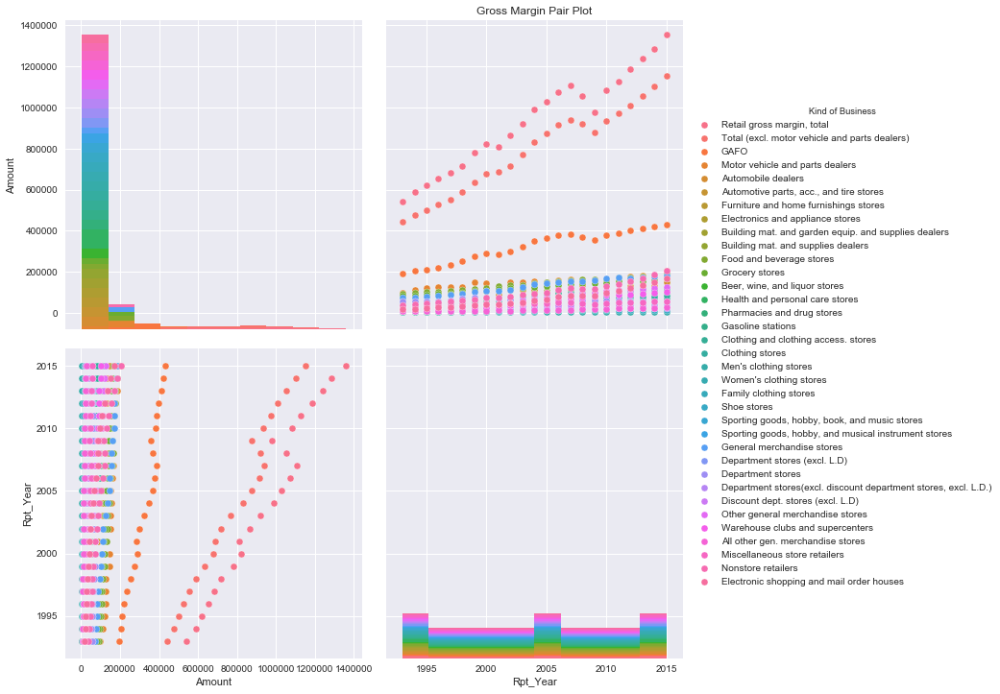

In [119]:
ShowPairplot(data=gmData, hue="Kind of Business", title="Gross Margin Pair Plot", size=5)

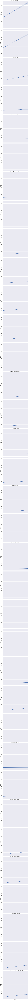

In [120]:
ShowLmplotByRowNoHue(data=gmData, x='Rpt_Year', y='Amount', row='Kind of Business', bins=30, size=10,
                     title='Gross Margin Cross Year (per Kind of Business per Chart) - 1993 ~ 2015')

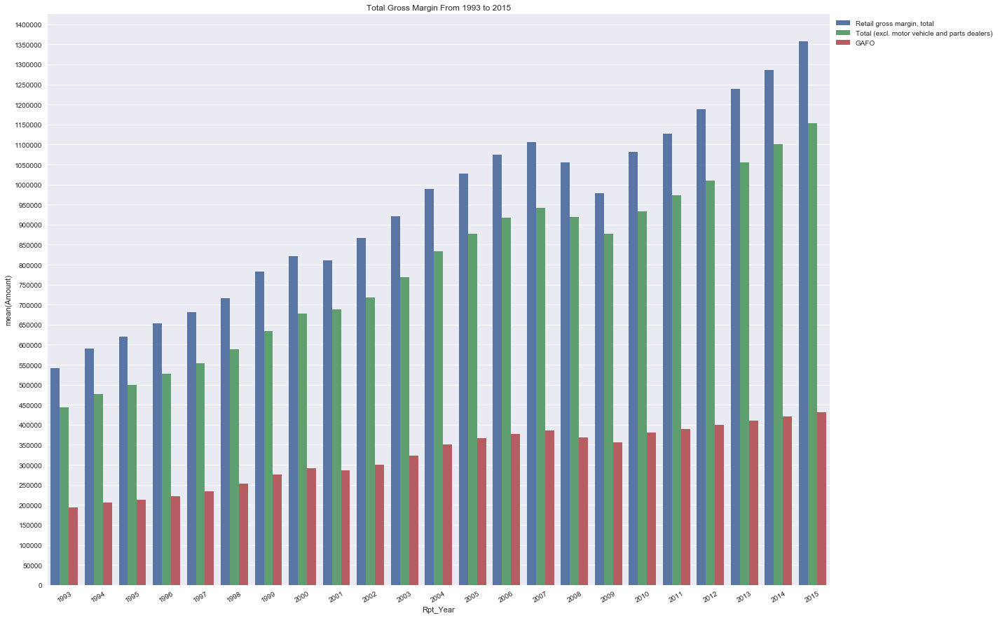

In [121]:
value_list= ['T4','T9','T1']

df = gmData[gmData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Total Gross Margin From 1993 to 2015',
           rotation=30,figsize_x=20, figsize_y=15)

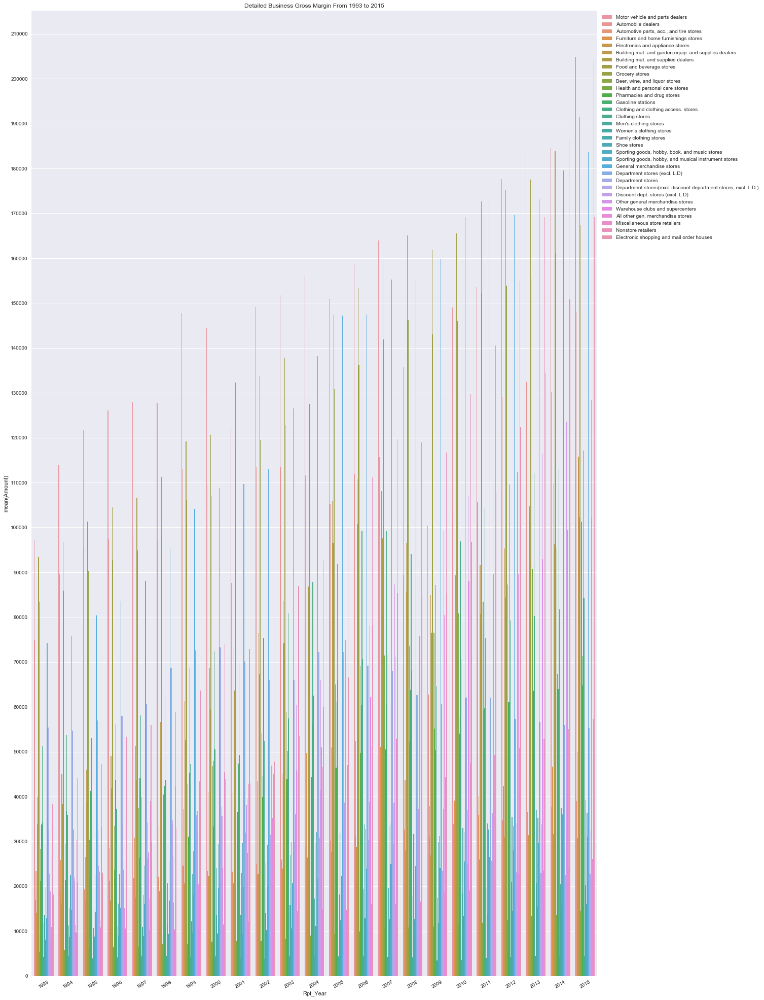

In [122]:
value_list= ['T4','T9','T1']

df = gmData[~gmData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Detailed Business Gross Margin From 1993 to 2015',
           rotation=30,figsize_x=20, figsize_y=35)

#### 2.3.2. Gross Margin Data Analysis Conclusion
	- The yearly total Gross Margin exactly reflects market trend which includes 1999-2000 IT Bubble & 2008 Financial Crisis. It's not a good indicator to predict the market.

#### 2.4.1.  Get Inventories Data to Analyze

In [123]:
retails_cnxn = pyodbc.connect(retailsConnStr)

inv_sql = "select * from New_Inventories"

invData = pd.read_sql(inv_sql, retails_cnxn)

retails_cnxn.close()

invData.head()

,NAICS Code,Kind of Business,Amount,Rpt_Year
0,T5,"Retail inventories, total",256167.0,1992
1,T9,Total (excl. motor vehicle and parts dealers),184701.0,1992
2,441,Motor vehicle and parts dealers,71466.0,1992
3,4411,Automobile dealers,57902.0,1992
4,4413,"Automotive parts, acc., and tire stores",8190.0,1992


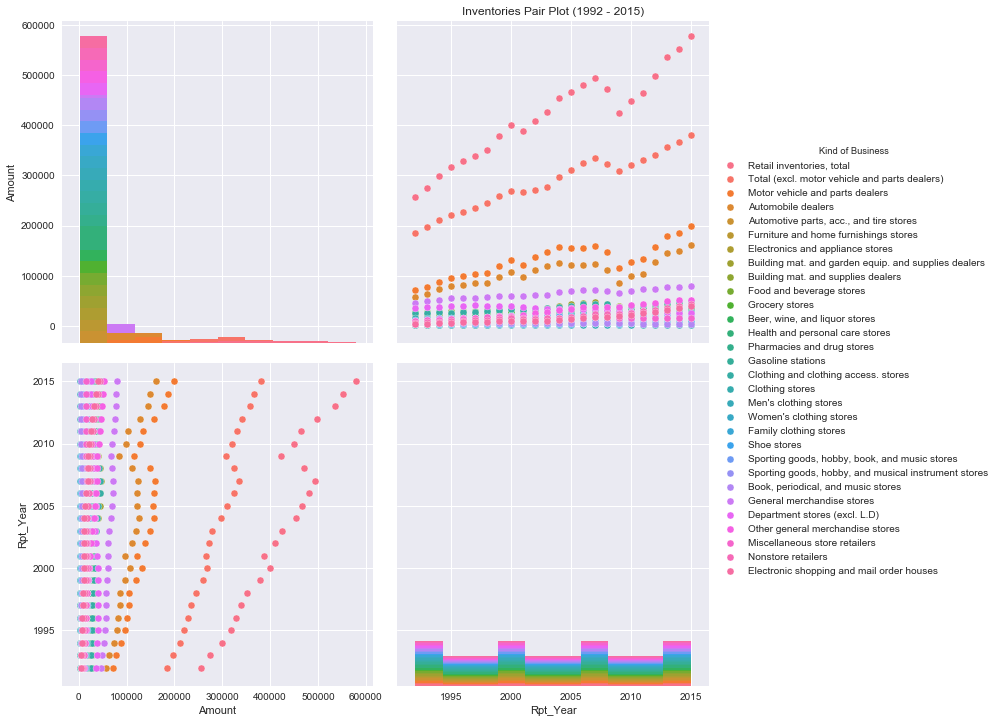

In [124]:
ShowPairplot(data=invData, hue="Kind of Business", title="Inventories Pair Plot (1992 - 2015)", size=5)

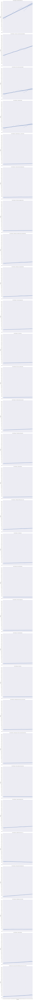

In [125]:
ShowLmplotByRowNoHue(data=invData, x='Rpt_Year', y='Amount', row='Kind of Business', bins=30, size=10,
                     title='Inventories Cross Year (per Kind of Business per Chart) - 1992 ~ 2015')

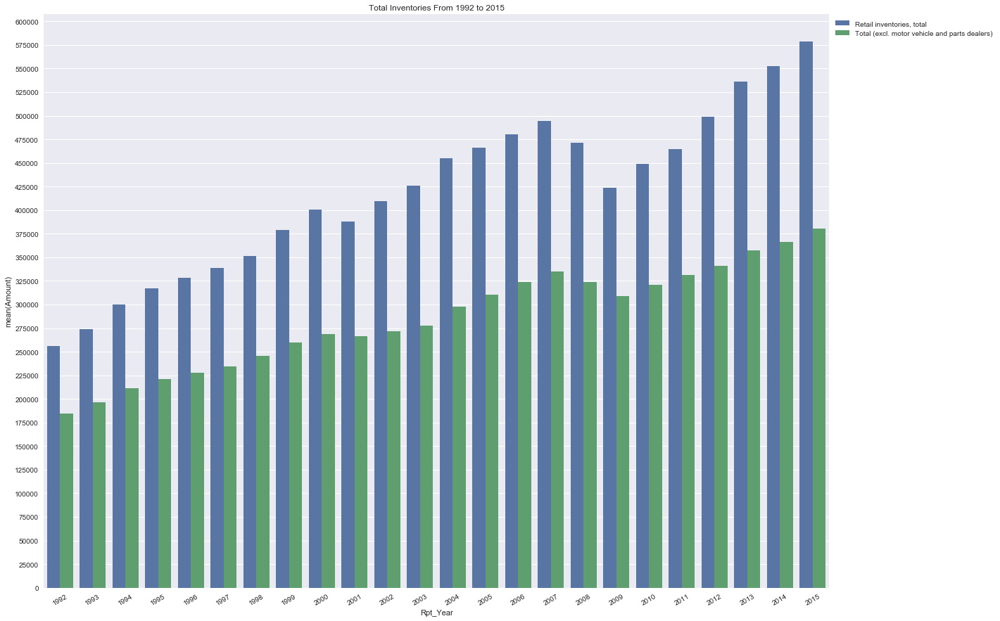

In [126]:
value_list= ['T5','T9']

df = invData[invData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Total Inventories From 1992 to 2015',
           rotation=30,figsize_x=20, figsize_y=15)

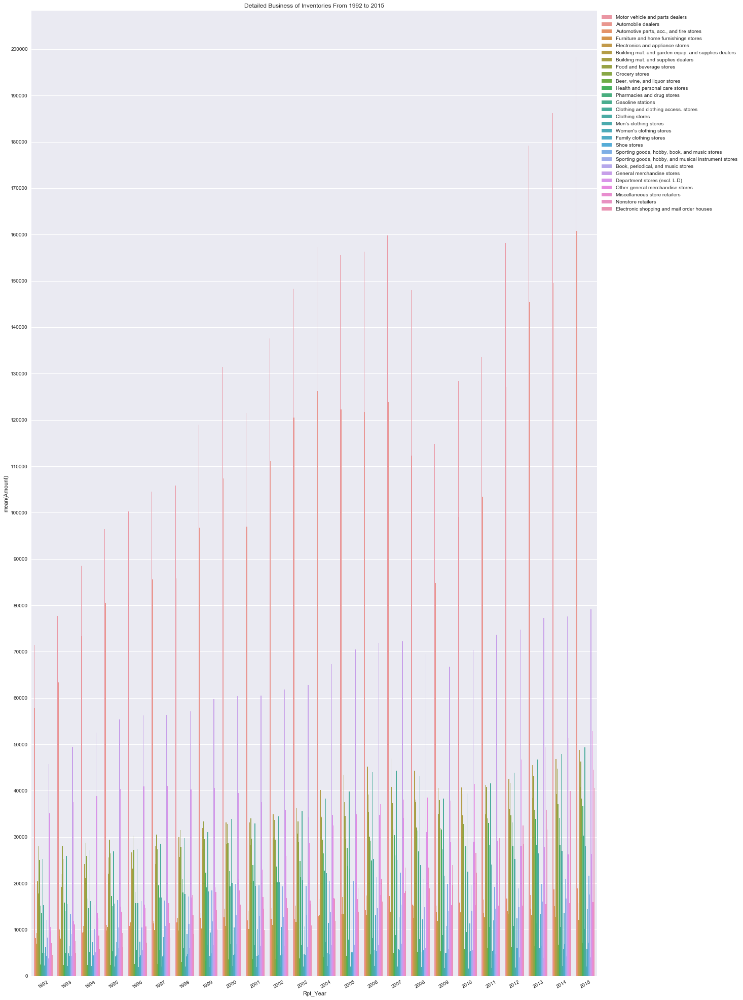

In [127]:
value_list= ['T5','T9']

df = invData[~invData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Detailed Business of Inventories From 1992 to 2015',
           rotation=30,figsize_x=20, figsize_y=35)

#### 2.4.2. Inventories Data Analysis Conclusion
	- The yearly total Inventories exactly reflects market trend which includes 1999-2000 IT Bubble & 2008 Financial Crisis. It's not a good indicator to predict the market.

#### 2.5.1.  Get Purchases Data to Analyze

In [128]:
retails_cnxn = pyodbc.connect(retailsConnStr)

p_sql = "select * from New_Purchases"

pData = pd.read_sql(p_sql, retails_cnxn)

retails_cnxn.close()

pData.head()

,NAICS Code,Kind of Business,Amount,Rpt_Year
0,T6,"Retail purchases, total",1318323.0,1992
1,T9,Total (excl. motor vehicle and parts dealers),981571.0,1992
2,T1,GAFO,358322.0,1992
3,441,Motor vehicle and parts dealers,336752.0,1992
4,4411,Automobile dealers,296678.0,1992


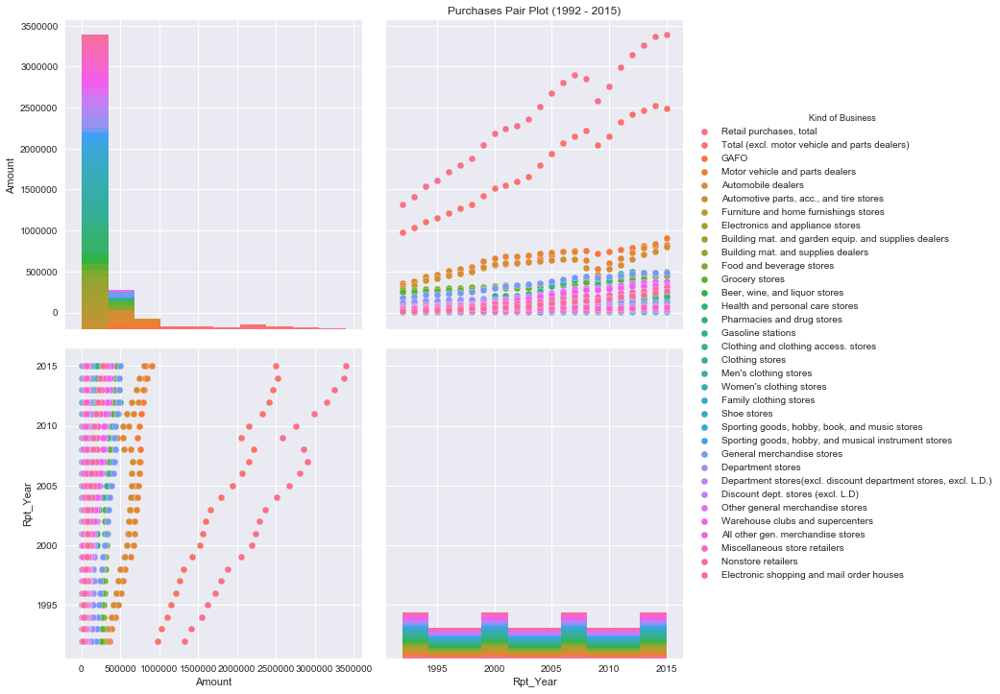

In [129]:
ShowPairplot(data=pData, hue="Kind of Business", title="Purchases Pair Plot (1992 - 2015)", size=5)

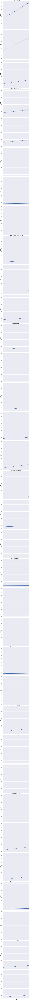

In [130]:
ShowLmplotByRowNoHue(data=pData, x='Rpt_Year', y='Amount', row='Kind of Business', bins=30, size=10,
                     title='Purchases Cross Year (per Kind of Business per Chart) - 1992 ~ 2015')

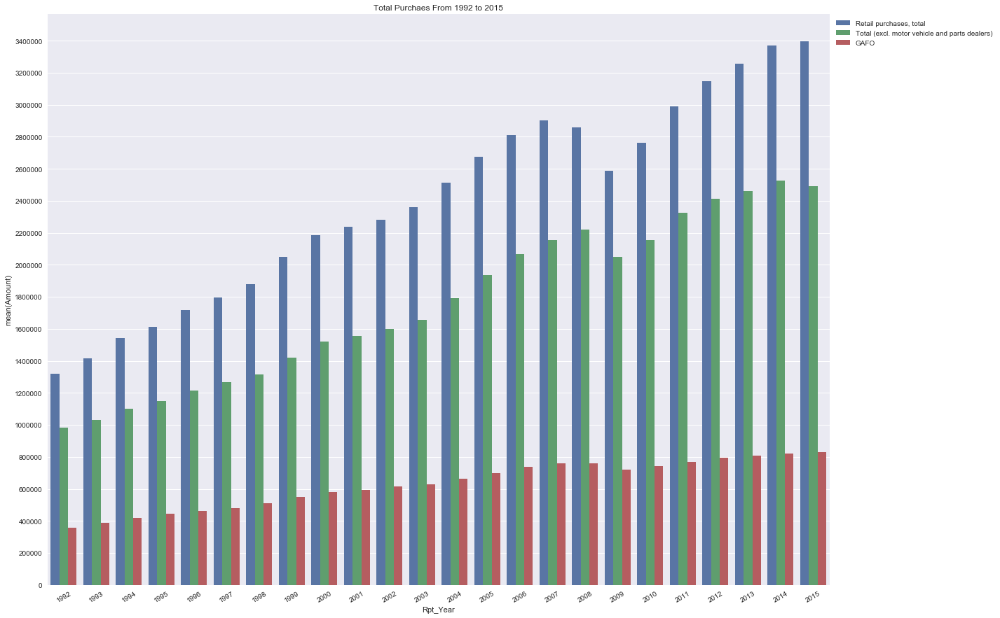

In [131]:
value_list= ['T6','T9','T1']

df = pData[pData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Total Purchaes From 1992 to 2015',
           rotation=30,figsize_x=20, figsize_y=15)

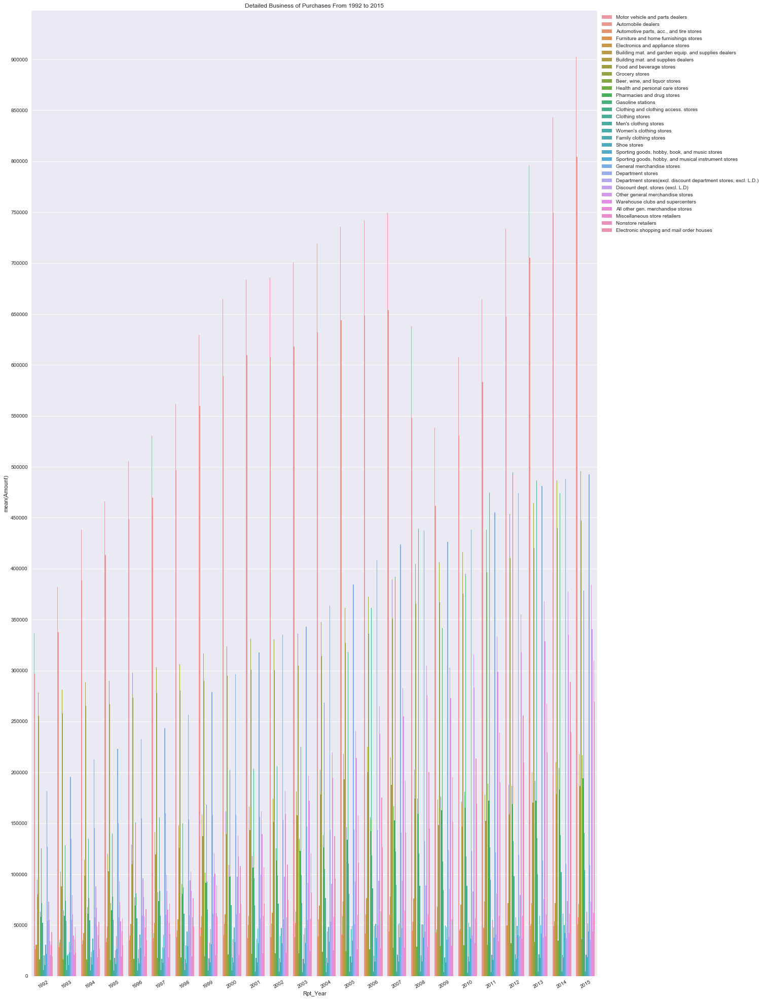

In [132]:
value_list= ['T6','T9','T1']

df = pData[~pData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Detailed Business of Purchases From 1992 to 2015',
           rotation=30,figsize_x=20, figsize_y=35)

#### 2.5.2. Purchases Data Analysis Conclusion
	- The yearly total purchases reflects market trend for 2008 Financial Crisis, but doesn't reflect 1999-2000 IT Bubble. It's not a good indicator to predict the market.

#### 2.6.1.  Get Sales Data to Analyze

In [133]:
retails_cnxn = pyodbc.connect(retailsConnStr)

s_sql = "select * from New_Sales"

sData = pd.read_sql(s_sql, retails_cnxn)

retails_cnxn.close()

sData.head()

,NAICS Code,Kind of Business,Amount,Rpt_Year
0,4521,Department stores (excl. L.D),232475.0,2000
1,45211,Department stores,232475.0,2000
2,452111,Department stores(excl. discount department st...,96282.0,2000
3,452112,Discount dept. stores (excl. L.D),136193.0,2000
4,4521,Department stores (excl. L.D),239921.0,2000


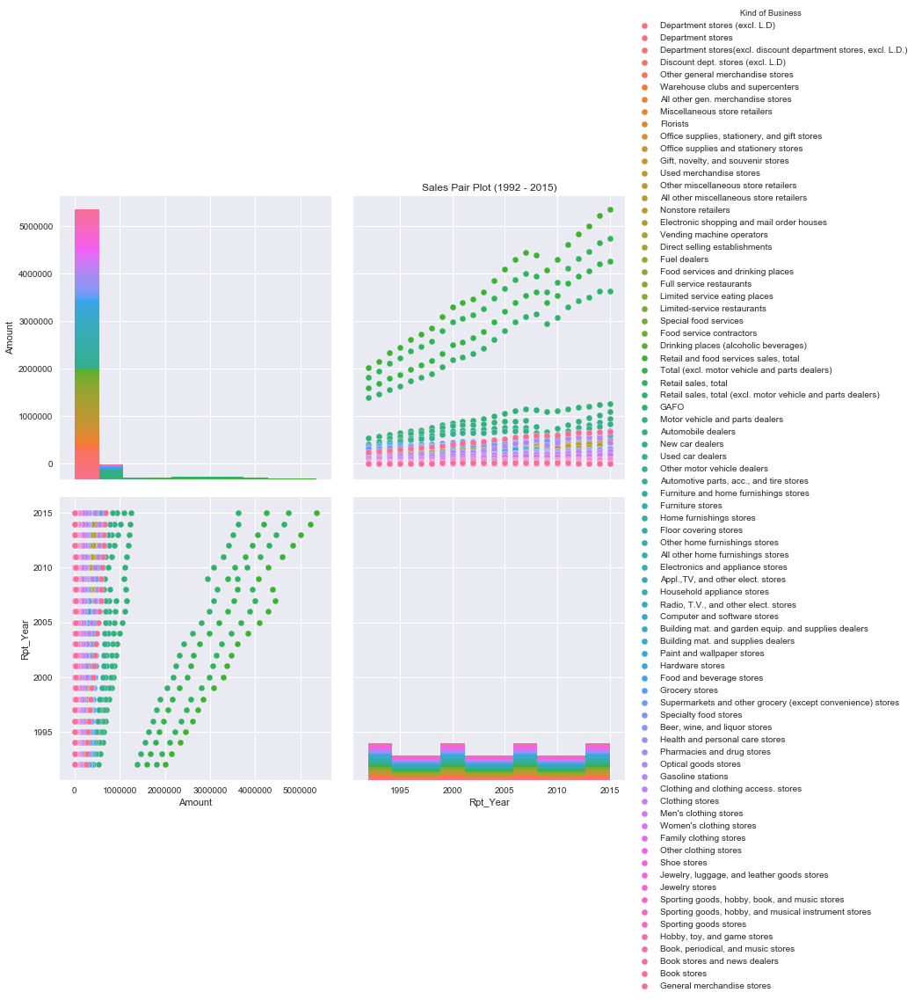

In [134]:
ShowPairplot(data=sData, hue="Kind of Business", title="Sales Pair Plot (1992 - 2015)", size=5)

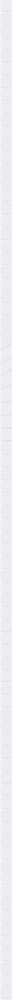

In [135]:
ShowLmplotByRowNoHue(data=sData, x='Rpt_Year', y='Amount', row='Kind of Business', bins=30, size=10,
                     title='Sales Cross Year (per Kind of Business per Chart) - 1992 ~ 2015')

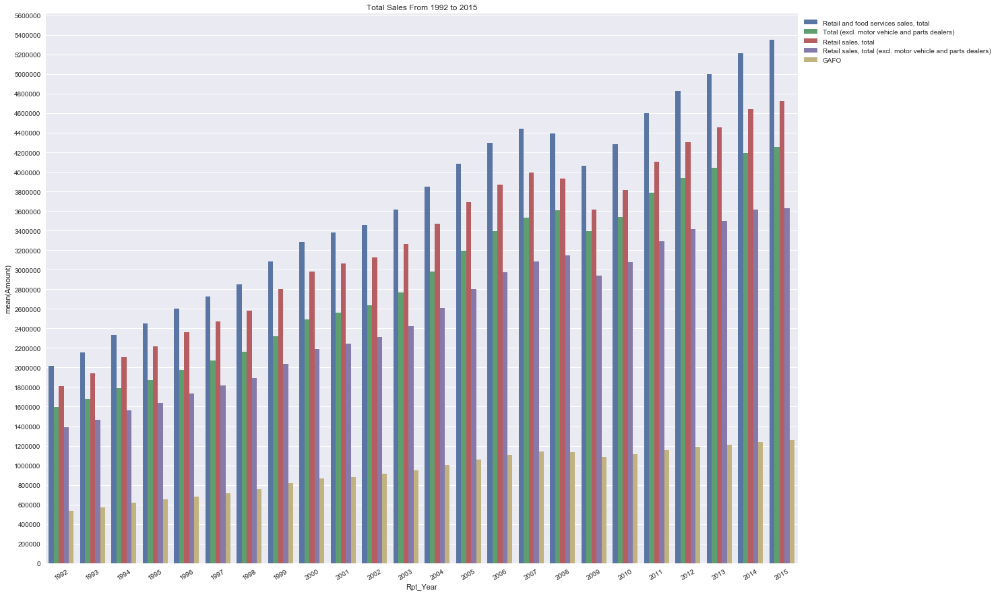

In [136]:
value_list= ['T2','T9','T1','T7','T8']

df = sData[sData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Total Sales From 1992 to 2015',
           rotation=30,figsize_x=20, figsize_y=15)

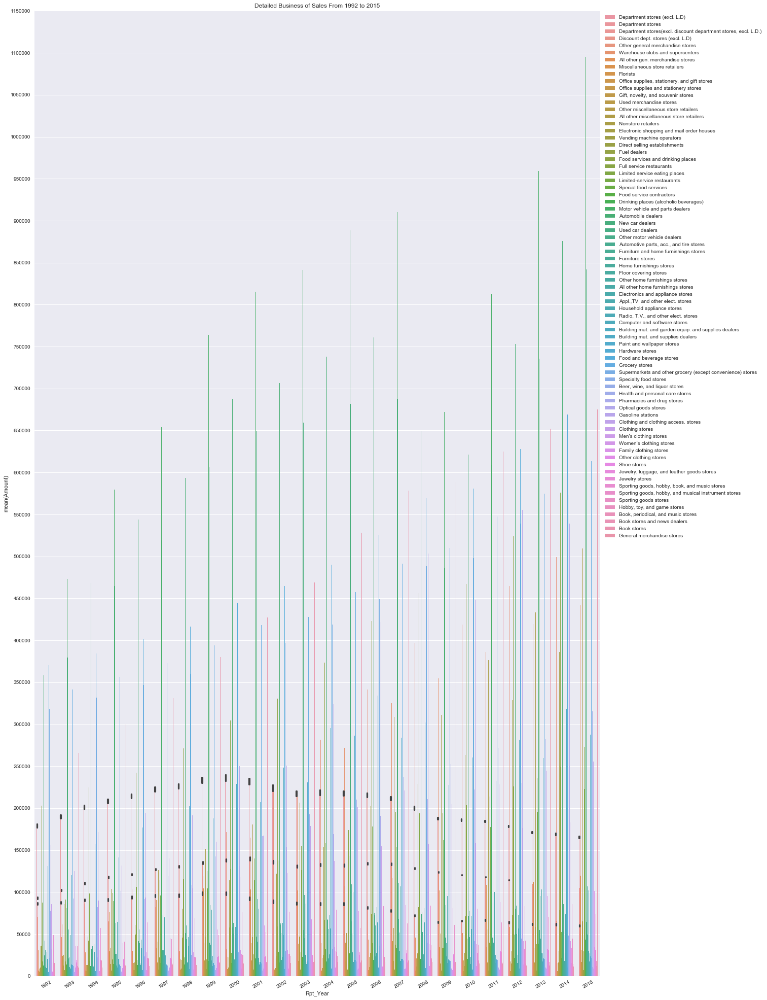

In [137]:
value_list= ['T2','T9','T1','T7','T8']

df = sData[~sData['NAICS Code'].isin(value_list)]

ShowBarPlot(data=df,x='Rpt_Year', y='Amount',hue='Kind of Business',bins=30, 
           title='Detailed Business of Sales From 1992 to 2015',
           rotation=30,figsize_x=20, figsize_y=35)

#### 2.6.2. Sales Data Analysis Conclusion
	- The yearly total Sales exactly reflects market trend for 2008 Financial Crisis. It's not a good indicator to predict the market.

#### 2.7.1.  Get Inflations Data to Analyze

In [138]:
def ShowBarplotNoHue(data,x,y,bins,title,fsize_x, fsize_y):
    fig, ax1 = plt.subplots(figsize=(fsize_x, fsize_y))

    g=sns.barplot(data=data, x=x, y=y, ax=ax1)
    plt.locator_params(nbins=bins)
    plt.title(title)

In [139]:
retails_cnxn = pyodbc.connect(retailsConnStr)

inf_sql = "select * from Inflations order by [Year]"

infData = pd.read_sql(inf_sql, retails_cnxn)

retails_cnxn.close()

infData.head()

,Year,Inflation
0,1986,0.0110
1,1987,0.0443
2,1988,0.0442
3,1989,0.0465
4,1990,0.0611


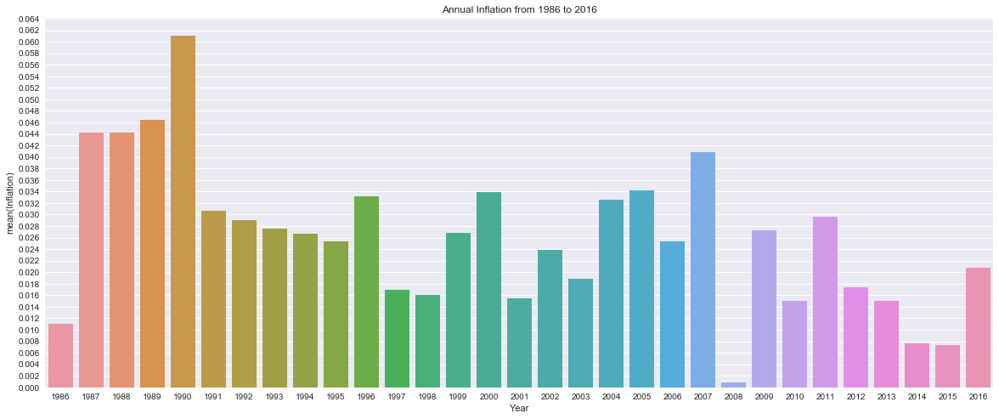

In [140]:
ShowBarplotNoHue(data=infData,x='Year',y='Inflation',bins=50,
                 title='Annual Inflation from 1986 to 2016',
                 fsize_x=20, fsize_y=8)

#### 2.7.2. Inflation Data Analysis Conclusion
	- Comparing with Annual Gross Margin % with Inflation data, the Gross Margin % report is a good pre-inflationary indicator. When GDP grows, inflation tends to increase.

#### 2.8.1.  Get Monthly Sales Data to Analyze

#### ** Monthly Sales Data

In [141]:
retails_cnxn = pyodbc.connect(retailsConnStr)

ms_sql = "select * from MonthlyRetailSales"

msData = pd.read_sql(ms_sql, retails_cnxn)

retails_cnxn.close()

msData.head()

,Data Type,NAICS Code,Kind of Business,01,02,03,04,05,06,07,08,09,10,11,12,TOTAL,Rpt_Year,CY CUM,PY CUM
0,NOT ADJUSTED,44814,Family clothing stores,1649.0,1864.0,2152.0,2438.0,2412.0,2516.0,2653.0,3046.0,2687.0,2993.0,3399.0,5337.0,33146.0,1992,NaN,NaN
1,NOT ADJUSTED,4482,Shoe stores,1206.0,1265.0,1463.0,1675.0,1560.0,1498.0,1449.0,1838.0,1578.0,1529.0,1516.0,2039.0,18616.0,1992,NaN,NaN
2,NOT ADJUSTED,44831,Jewelry stores,796.0,1021.0,912.0,969.0,1171.0,1094.0,1037.0,1089.0,1034.0,1122.0,1364.0,3436.0,15045.0,1992,NaN,NaN
3,NOT ADJUSTED,451,"Sporting goods, hobby, book, and music stores",3439.0,3264.0,3473.0,3523.0,3545.0,3611.0,3637.0,3986.0,3797.0,3758.0,4428.0,8565.0,49026.0,1992,NaN,NaN
4,NOT ADJUSTED,45111,Sporting goods stores,972.0,1100.0,1214.0,1267.0,1293.0,1334.0,1340.0,1377.0,1206.0,1120.0,1207.0,2153.0,15583.0,1992,NaN,NaN


In [142]:
retails_cnxn = pyodbc.connect(retailsConnStr)

#unpivot data
ums_sql = "select Rpt_Year, [Data Type], [NAICS  Code], [Kind of Business],Total, u.[Period], u.Amount from MonthlyRetailSales s unpivot (Amount for [Period] in ([01], [02],[03], [04],[05],[06],[07],[08],[09],[10],[11],[12],[CY CUM], [PY CUM])) u;"

umsData = pd.read_sql(ums_sql, retails_cnxn)

retails_cnxn.close()

umsData.head()

,Rpt_Year,Data Type,NAICS Code,Kind of Business,Total,Period,Amount
0,1992,NOT ADJUSTED,44814,Family clothing stores,33146.0,01,1649.0
1,1992,NOT ADJUSTED,44814,Family clothing stores,33146.0,02,1864.0
2,1992,NOT ADJUSTED,44814,Family clothing stores,33146.0,03,2152.0
3,1992,NOT ADJUSTED,44814,Family clothing stores,33146.0,04,2438.0
4,1992,NOT ADJUSTED,44814,Family clothing stores,33146.0,05,2412.0


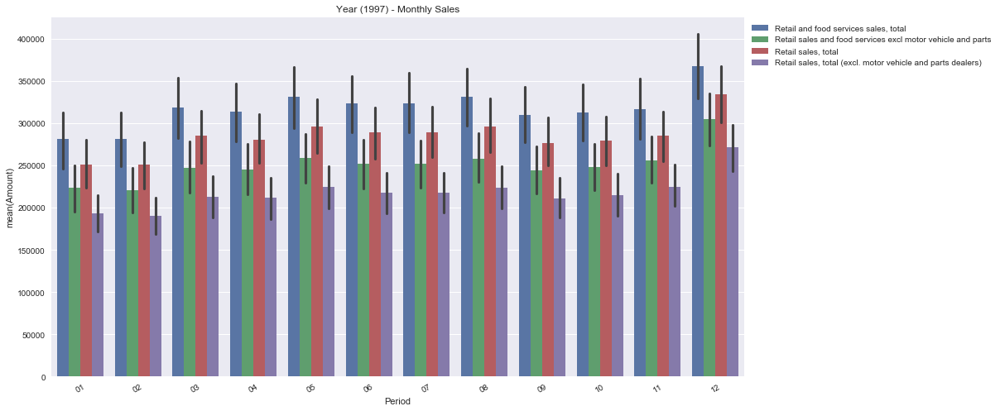

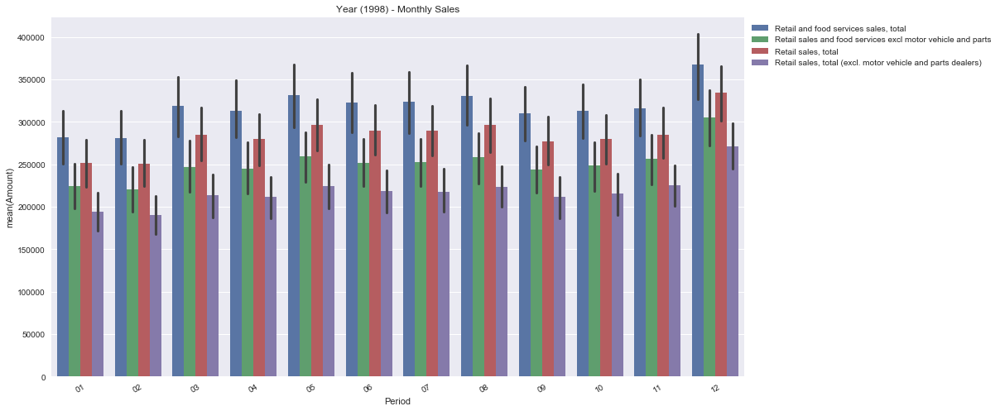

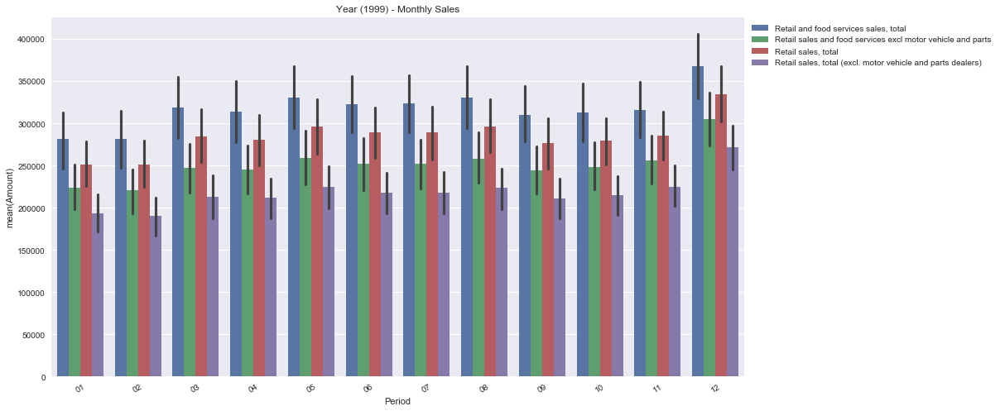

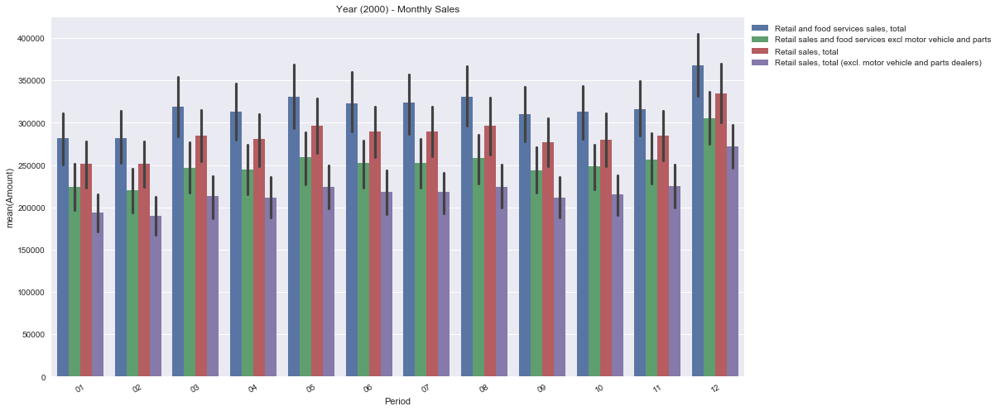

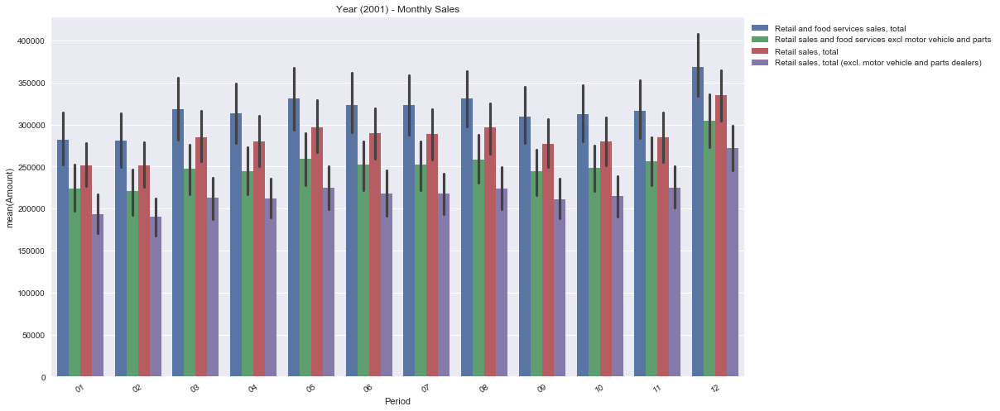

In [143]:
df = umsData.loc[(umsData['Data Type'] == "NOT ADJUSTED")]

years = [1997,1998,1999,2000,2001] #df['Rpt_Year'].unique() 

periods = ["CY CUM", "PY CUM"]

value_list= ['Retail and food services sales, total',
             'Retail sales and food services excl motor vehicle and parts',
             'Retail sales, total',
             'Retail sales, total (excl. motor vehicle and parts dealers)']

df = df[df['Kind of Business'].isin(value_list)]
df = df[~df['Period'].isin(periods)]
#businesses = df['Kind of Business'].unique() 

for year in years:
    dt = df.loc[(df['Rpt_Year'] == year)]        
        
    title = "Year (" + str(year) + ") - Monthly Sales" 
        
    ShowBarPlot(data=df, x='Period',y='Amount',hue='Kind of Business',
                bins=14, title=title, rotation=30,figsize_x=15, figsize_y=8)

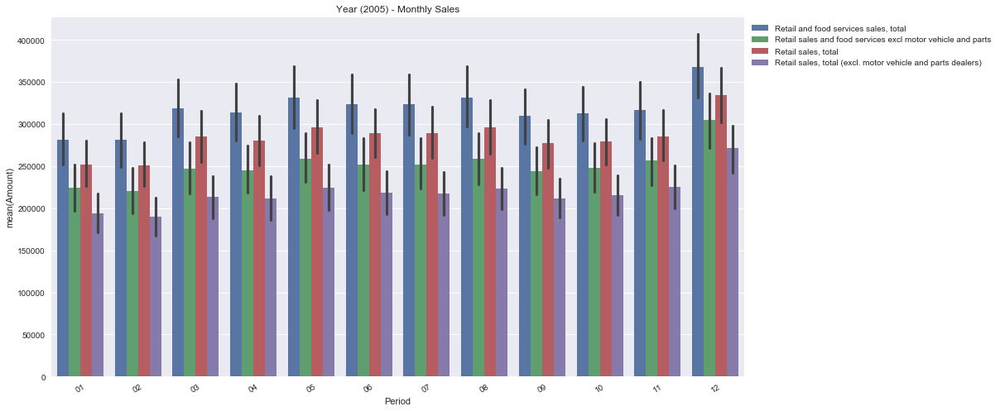

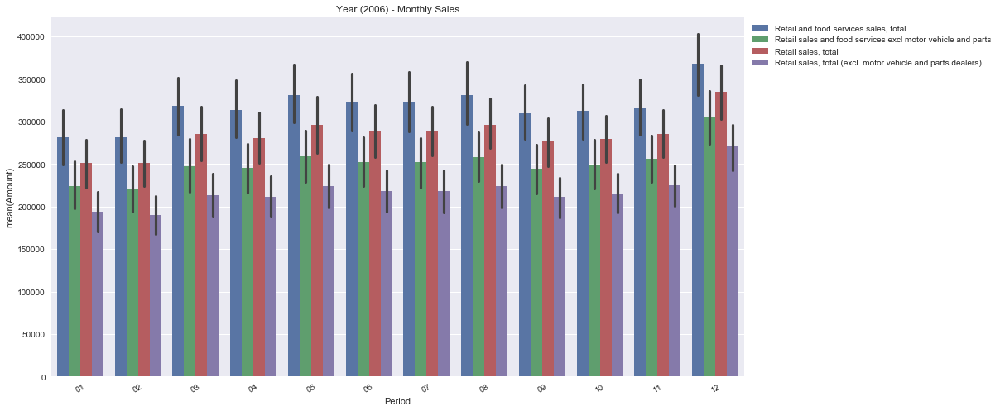

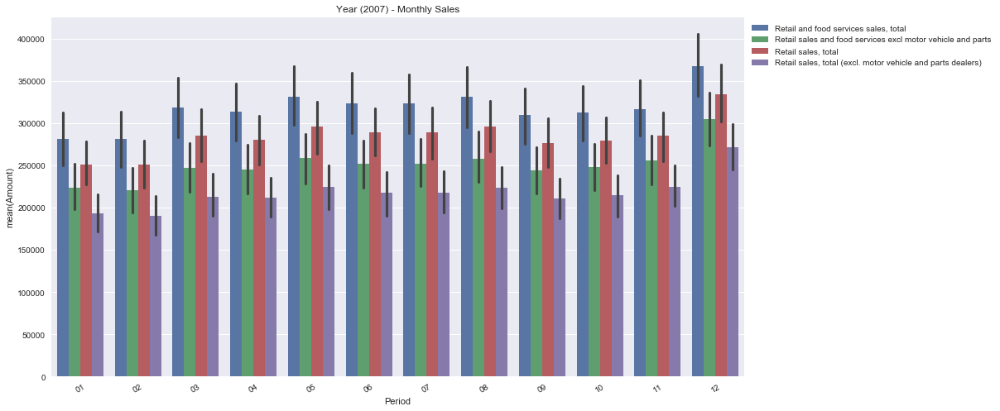

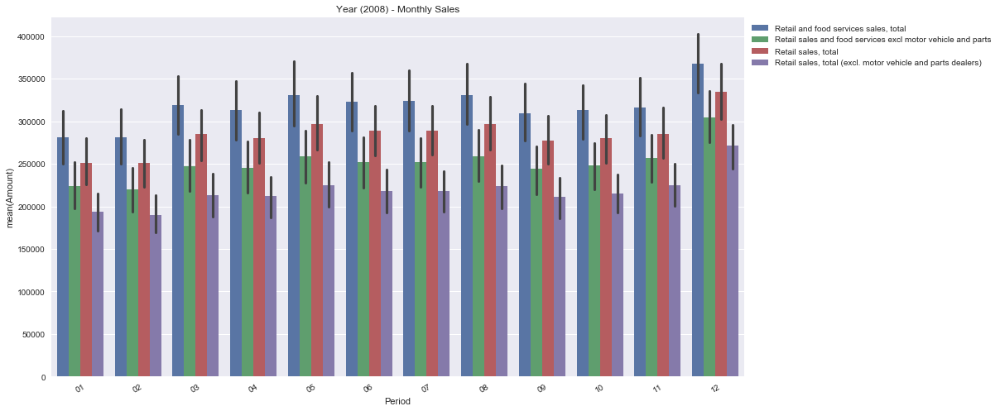

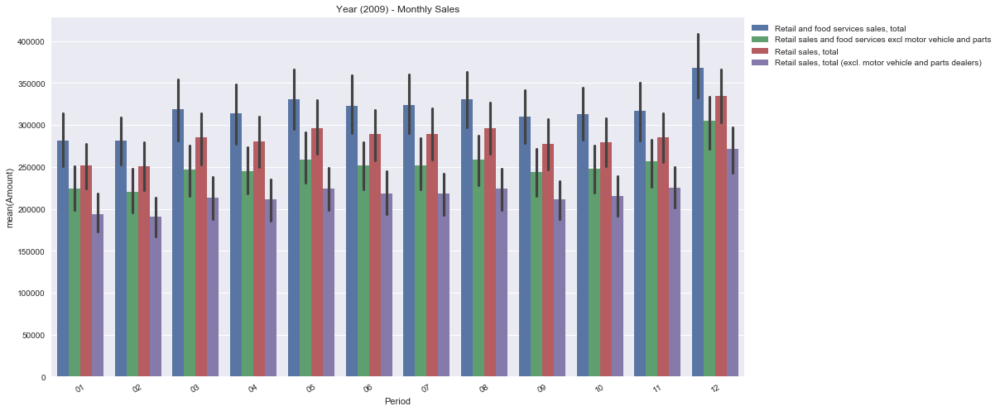

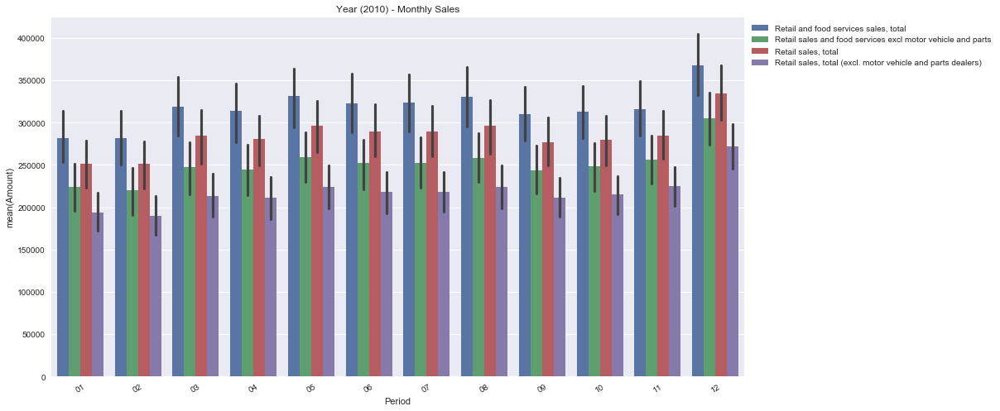

In [144]:
df = umsData.loc[(umsData['Data Type'] == "NOT ADJUSTED")]

years = [2005,2006,2007,2008,2009,2010] #df['Rpt_Year'].unique() 

periods = ["CY CUM", "PY CUM"]

value_list= ['Retail and food services sales, total',
             'Retail sales and food services excl motor vehicle and parts',
             'Retail sales, total',
             'Retail sales, total (excl. motor vehicle and parts dealers)']

df = df[df['Kind of Business'].isin(value_list)]
df = df[~df['Period'].isin(periods)]
#businesses = df['Kind of Business'].unique() 

for year in years:
    dt = df.loc[(df['Rpt_Year'] == year)]        
        
    title = "Year (" + str(year) + ") - Monthly Sales" 
        
    ShowBarPlot(data=df, x='Period',y='Amount',hue='Kind of Business',
                bins=14, title=title, rotation=30,figsize_x=15, figsize_y=8)

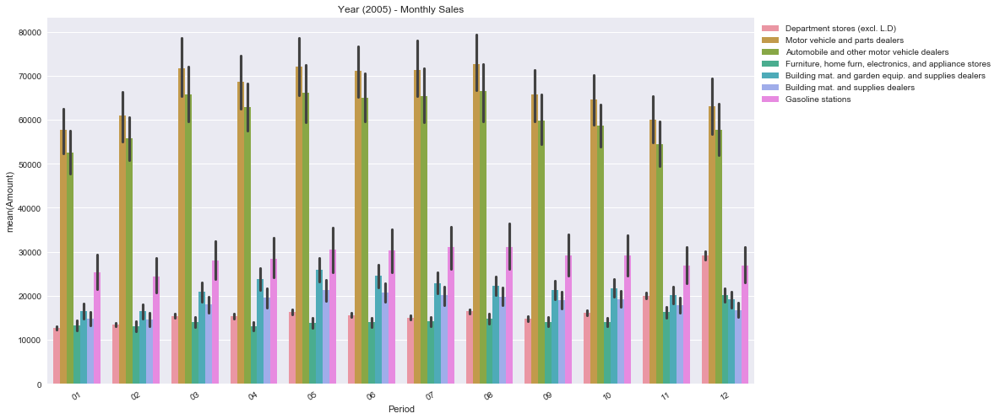

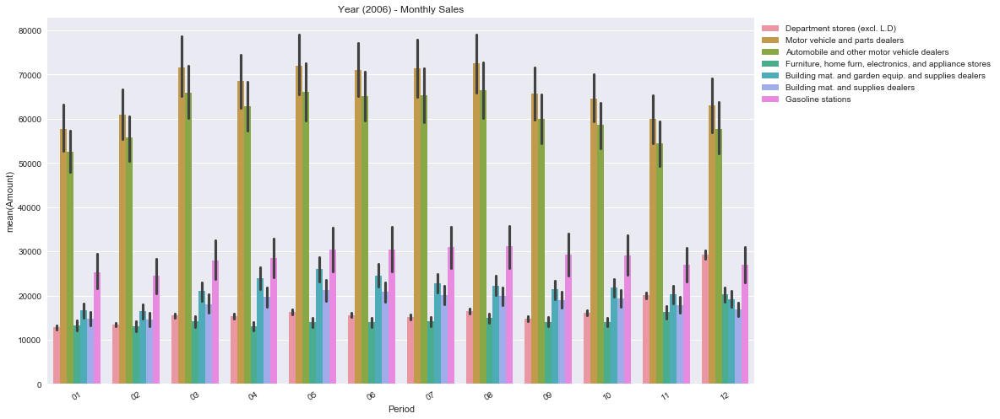

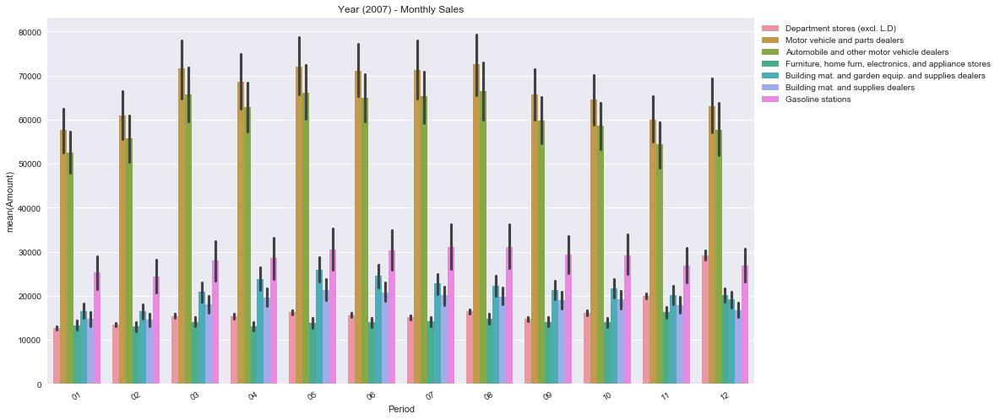

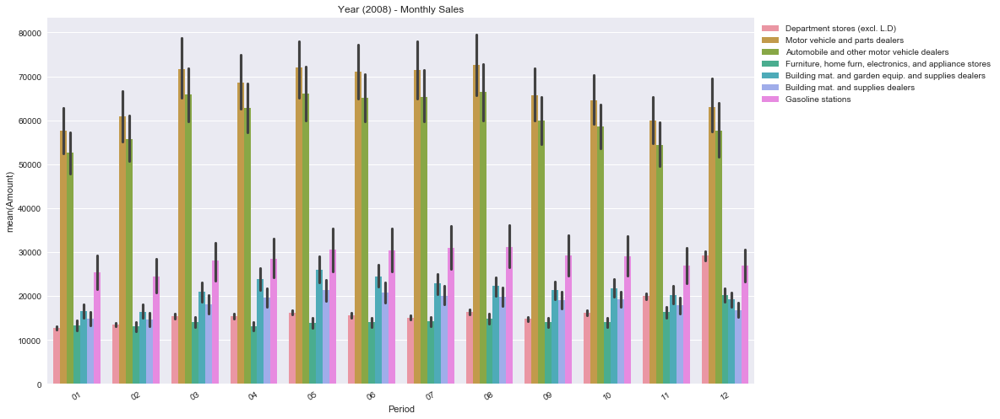

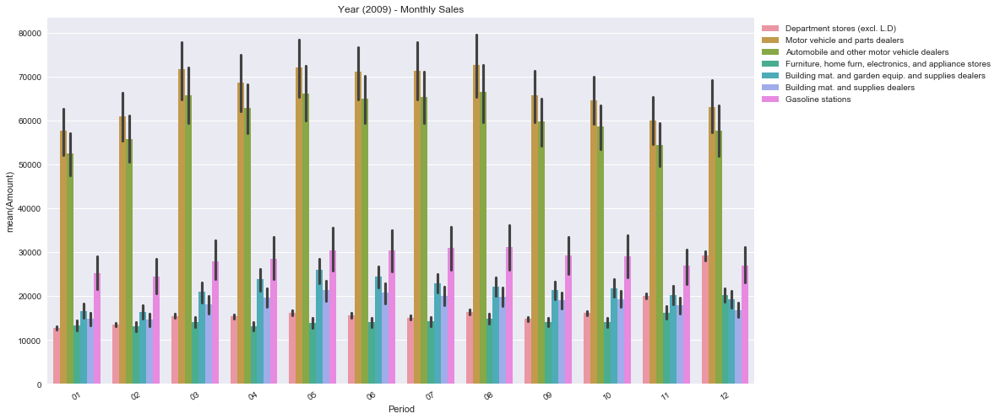

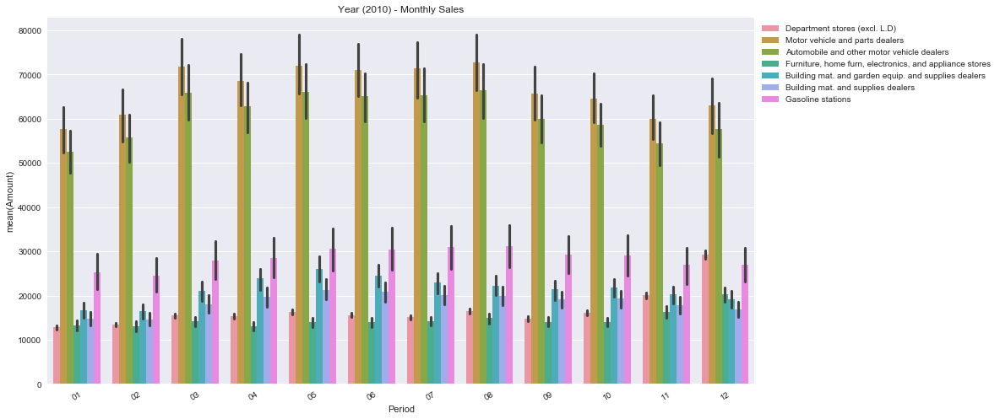

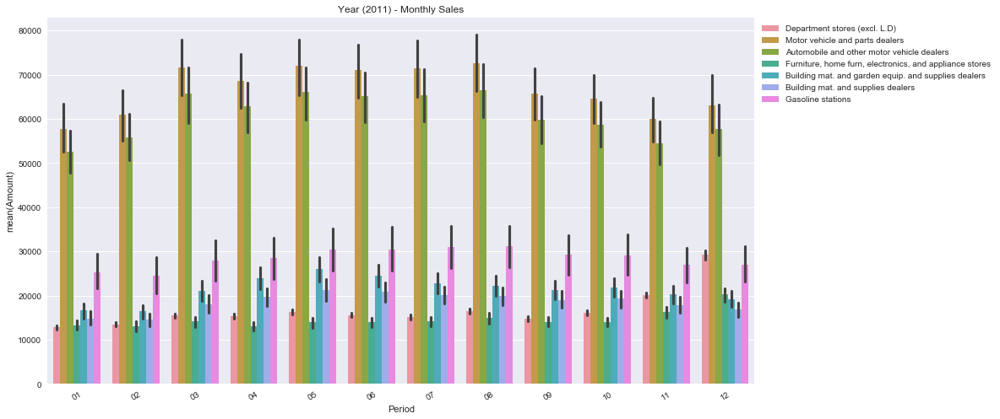

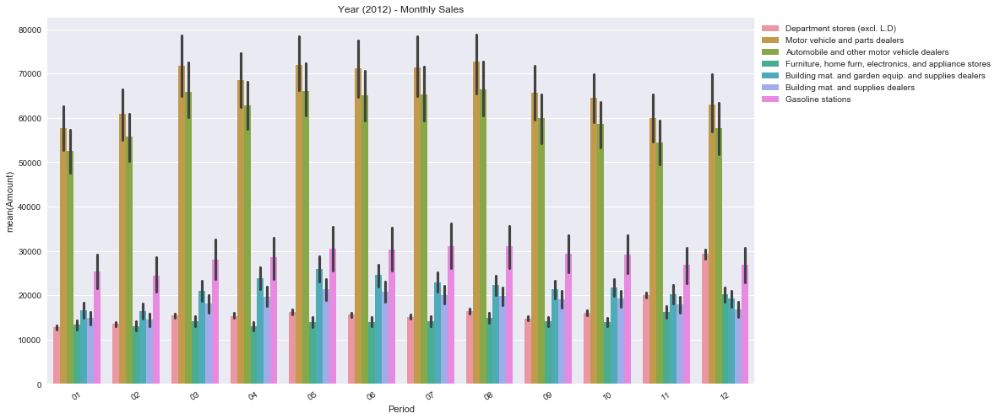

In [145]:
df = umsData.loc[(umsData['Data Type'] == "NOT ADJUSTED")]

years = [2005,2006,2007,2008,2009,2010,2011,2012] #df['Rpt_Year'].unique() 

periods = ["CY CUM", "PY CUM"]

value_list= ['Building mat. and garden equip. and supplies dealers',
             'Building mat. and supplies dealers',
             'Automobile and other motor vehicle dealers',
             'Motor vehicle and parts dealers',
             'Department stores (excl. L.D)', 
             'Furniture, home furn, electronics, and appliance stores',
             'Gasoline stations']

df = df[df['Kind of Business'].isin(value_list)]
df = df[~df['Period'].isin(periods)]
#businesses = df['Kind of Business'].unique() 

for year in years:
    dt = df.loc[(df['Rpt_Year'] == year)]        
        
    title = "Year (" + str(year) + ") - Monthly Sales" 
        
    ShowBarPlot(data=df, x='Period',y='Amount',hue='Kind of Business',
                bins=14, title=title, rotation=30,figsize_x=15, figsize_y=8)

#### ** Monthly Sales and Monthly Sale Change % By Comparing Previous Year Monthly Sales Data

In [146]:
fd = open('MonthlySaleChgPct.sql', 'r')
msChgPct_sql = fd.read()
fd.close()

print (msChgPct_sql)

select 
	curr.Rpt_Year, curr.[Data Type], curr.[NAICS  Code], curr.[Kind of Business]
	,prev.[01] as Prev_01, ((curr.[01] - prev.[01]) / curr.[01]) as [01 Chg%], curr.[01] as Curr_01

	,prev.[02] as Prev_02, ((curr.[02] - prev.[02]) / curr.[02]) as [02 Chg%], curr.[02] as Curr_02
	,prev.[03] as Prev_03, ((curr.[03] - prev.[03]) / curr.[03]) as [03 Chg%], curr.[03] as Curr_03
	,prev.[04] as Prev_04, ((curr.[04] - prev.[04]) / curr.[04]) as [04 Chg%], curr.[04] as Curr_04
	,prev.[05] as Prev_05, ((curr.[05] - prev.[05]) / curr.[05]) as [05 Chg%], curr.[05] as Curr_05
	,prev.[06] as Prev_06, ((curr.[06] - prev.[06]) / curr.[06]) as [06 Chg%], curr.[06] as Curr_06
	,prev.[07] as Prev_07, ((curr.[07] - prev.[07]) / curr.[07]) as [07 Chg%], curr.[07] as Curr_07
	,prev.[08] as Prev_08, ((curr.[08] - prev.[08]) / curr.[08]) as [08 Chg%], curr.[08] as Curr_08
	,prev.[09] as Prev_09, ((curr.[09] - prev.[09]) / curr.[09]) as [09 Chg%], curr.[09] as Curr_09
	,prev.[10] as Prev_10, ((curr.[10] - pr

In [147]:
retails_cnxn = pyodbc.connect(retailsConnStr)
msChgPctData = pd.read_sql(msChgPct_sql, retails_cnxn)
retails_cnxn.close()

msChgPctData.head()

,Rpt_Year,Data Type,NAICS Code,Kind of Business,Prev_01,01 Chg%,Curr_01,Prev_02,02 Chg%,Curr_02,...,Curr_09,Prev_10,10 Chg%,Curr_10,Prev_11,11 Chg%,Curr_11,Prev_12,12 Chg%,Curr_12
0,1992,ADJUSTED(3),45299,All other gen. merchandise stores,NaN,NaN,2682.0,NaN,NaN,2621.0,...,2504.0,NaN,NaN,2562.0,NaN,NaN,2576.0,NaN,NaN,2666.0
1,1992,ADJUSTED(3),"4411,4412",Automobile and other motor vehicle dealers,NaN,NaN,30167.0,NaN,NaN,30457.0,...,32369.0,NaN,NaN,32396.0,NaN,NaN,32336.0,NaN,NaN,32693.0
2,1992,ADJUSTED(3),4413,"Automotive parts, acc., and tire stores",NaN,NaN,3311.0,NaN,NaN,3360.0,...,3521.0,NaN,NaN,3576.0,NaN,NaN,3592.0,NaN,NaN,3579.0
3,1992,ADJUSTED(3),4453,"Beer, wine, and liquor stores",NaN,NaN,1713.0,NaN,NaN,1763.0,...,1836.0,NaN,NaN,1854.0,NaN,NaN,1853.0,NaN,NaN,1856.0
4,1992,ADJUSTED(3),444,Building mat. and garden equip. and supplies d...,NaN,NaN,10845.0,NaN,NaN,10904.0,...,10980.0,NaN,NaN,10971.0,NaN,NaN,10873.0,NaN,NaN,11082.0


#### ** Unpivoted Monthly Sales and Monthly Sale Change % By Comparing Previous Year Monthly Sales Data

In [148]:
fd = open('Unpoviot_MonthlySaleChgPct.sql', 'r')
umsChgPct_sql = fd.read()
fd.close()

print (umsChgPct_sql)


;with msChgPct as (
	select 
		curr.Rpt_Year, curr.[Data Type], curr.[NAICS  Code], curr.[Kind of Business]
		,prev.[01] as Prev_01, ((curr.[01] - prev.[01]) / curr.[01]) as [01], curr.[01] as Curr_01

		,prev.[02] as Prev_02, ((curr.[02] - prev.[02]) / curr.[02]) as [02], curr.[02] as Curr_02
		,prev.[03] as Prev_03, ((curr.[03] - prev.[03]) / curr.[03]) as [03], curr.[03] as Curr_03
		,prev.[04] as Prev_04, ((curr.[04] - prev.[04]) / curr.[04]) as [04], curr.[04] as Curr_04
		,prev.[05] as Prev_05, ((curr.[05] - prev.[05]) / curr.[05]) as [05], curr.[05] as Curr_05
		,prev.[06] as Prev_06, ((curr.[06] - prev.[06]) / curr.[06]) as [06], curr.[06] as Curr_06
		,prev.[07] as Prev_07, ((curr.[07] - prev.[07]) / curr.[07]) as [07], curr.[07] as Curr_07
		,prev.[08] as Prev_08, ((curr.[08] - prev.[08]) / curr.[08]) as [08], curr.[08] as Curr_08
		,prev.[09] as Prev_09, ((curr.[09] - prev.[09]) / curr.[09]) as [09], curr.[09] as Curr_09
		,prev.[10] as Prev_10, ((curr.[10] - prev.[10]) / c

In [149]:
retails_cnxn = pyodbc.connect(retailsConnStr)
umsChgPctData = pd.read_sql(umsChgPct_sql, retails_cnxn)
retails_cnxn.close()

umsChgPctData.head()

,Rpt_Year,Data Type,NAICS Code,Kind of Business,Period,chg_pct
0,1993,ADJUSTED(3),45299,All other gen. merchandise stores,01,-1.016949
1,1993,ADJUSTED(3),45299,All other gen. merchandise stores,02,2.709725
2,1993,ADJUSTED(3),45299,All other gen. merchandise stores,03,7.046980
3,1993,ADJUSTED(3),45299,All other gen. merchandise stores,04,5.151176
4,1993,ADJUSTED(3),45299,All other gen. merchandise stores,05,7.887947


In [150]:
df = umsChgPctData.loc[(umsChgPctData['Data Type'] == "ADJUSTED(3)")]

value_list= ['Building mat. and garden equip. and supplies dealers',
             'Building mat. and supplies dealers',
             'Automobile and other motor vehicle dealers',
             'Motor vehicle and parts dealers',
             'Department stores (excl. L.D)', 
             'Furniture, home furn, electronics, and appliance stores',
             'Gasoline stations']

df = df[df['Kind of Business'].isin(value_list)]

df.head()

,Rpt_Year,Data Type,NAICS Code,Kind of Business,Period,chg_pct
297,1993,ADJUSTED(3),"4411,4412",Automobile and other motor vehicle dealers,01,11.328297
298,1993,ADJUSTED(3),"4411,4412",Automobile and other motor vehicle dealers,02,7.948741
299,1993,ADJUSTED(3),"4411,4412",Automobile and other motor vehicle dealers,03,7.829171
300,1993,ADJUSTED(3),"4411,4412",Automobile and other motor vehicle dealers,04,12.878418
301,1993,ADJUSTED(3),"4411,4412",Automobile and other motor vehicle dealers,05,12.532963


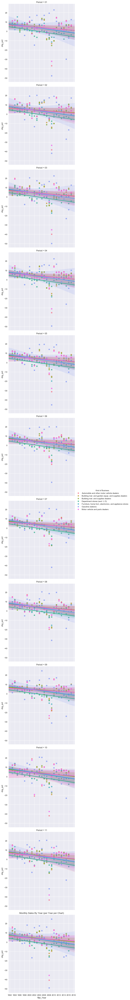

In [151]:
g= sns.lmplot(x='Rpt_Year', y='chg_pct', hue='Kind of Business', row='Period', data=df, size=6)
plt.locator_params(nbins=14)
plt.title('Monthly Sales By Year (per Year per Chart)')

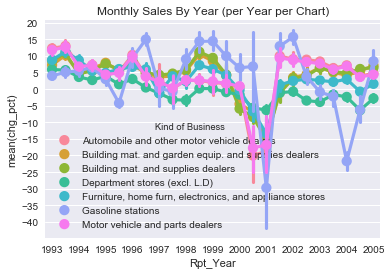

In [152]:
g= sns.pointplot(x='Rpt_Year', y='chg_pct', hue='Kind of Business', row='Period', data=df, size=6)
plt.locator_params(nbins=14)
plt.title('Monthly Sales By Year (per Year per Chart)')

#### 2.8.2. Monthly Retail Sales Data Analyzing Conclusion

	- The following businesses sales decreased before 2007 Dec ressesion, they can be used to predict the market:

		1) Building mat. and garden equip. and supplies dealers
		2) Building mat. and supplies dealers
		3) Automobile and other motor vehicle dealers
	
	- Overall, Motor vehicle and parts dealers sales decreased relatively (comparing with 2006 Nov. sales)

	- Department stores (excl. L.D) sales decreased from year 2001

	- Gasoline stations sales decreased from 2013 (due to gas price dropped?)

	- Furniture, home furn, electronics, and appliance stores is not fully recoveried comparing with year 2006 data

	- The following business sales keeps increasing, even during 2008 crisis: ( comparing yearly total increasing % with inflation rate)
		1) Electronic shopping and mail order houses
		2) Food and beverage stores
		3) Food services and drinking places
		4) General merchandise stores
		5) Grocery stores
		6) Health and personal care stores
		7) Nonstore retailers
		8) Other general merchandise stores
		9) Pharmacies and drug stores
		10) Supermarkets and other grocery (except convenience) stores
		11) Warehouse clubs and supercenters

	- Jan. and Feb. Sales are the lowest months among 12 months. Dec. Sales are the highest in a year. 

	- The previous year and current year sales change % data is more sensitive to the market changes. It can be used to predict the market trend.